IMPORT LIBRARIES 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")


IMPORT DATA

In [2]:
power= pd.read_csv("C:/Users/mansi/OneDrive/Documents/CAPSTONE_PROJECT_DATASETS/4_Power_consumption_PR4_BIA/powerconsumption.csv")
power.head(5)

,Datetime,Temperature,Humidity,WindSpeed,GeneralDiffuseFlows,DiffuseFlows,PowerConsumption_Zone1,PowerConsumption_Zone2,PowerConsumption_Zone3
0,2017-01-01 00:00:00,6.559,73.8,0.083,0.051,0.119,34055.69620,16128.87538,20240.96386
1,2017-01-01 00:10:00,6.414,74.5,0.083,0.070,0.085,29814.68354,19375.07599,20131.08434
2,2017-01-01 00:20:00,6.313,74.5,0.080,0.062,0.100,29128.10127,19006.68693,19668.43373
3,2017-01-01 00:30:00,6.121,75.0,0.083,0.091,0.096,28228.86076,18361.09422,18899.27711
4,2017-01-01 00:40:00,5.921,75.7,0.081,0.048,0.085,27335.69620,17872.34043,18442.40964


DATA CLEAN 

In [3]:
power.isnull().sum()

Datetime                  0
Temperature               0
Humidity                  0
WindSpeed                 0
GeneralDiffuseFlows       0
DiffuseFlows              0
PowerConsumption_Zone1    0
PowerConsumption_Zone2    0
PowerConsumption_Zone3    0
dtype: int64

In [4]:
power.duplicated().sum()

0

DATA UNDERSTANDING 

In [5]:
power.describe()

,Temperature,Humidity,WindSpeed,GeneralDiffuseFlows,DiffuseFlows,PowerConsumption_Zone1,PowerConsumption_Zone2,PowerConsumption_Zone3
count,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000,52416.000000
mean,18.810024,68.259518,1.959489,182.696614,75.028022,32344.970564,21042.509082,17835.406218
std,5.815476,15.551177,2.348862,264.400960,124.210949,7130.562564,5201.465892,6622.165099
min,3.247000,11.340000,0.050000,0.004000,0.011000,13895.696200,8560.081466,5935.174070
25%,14.410000,58.310000,0.078000,0.062000,0.122000,26310.668692,16980.766032,13129.326630
50%,18.780000,69.860000,0.086000,5.035500,4.456000,32265.920340,20823.168405,16415.117470
75%,22.890000,81.400000,4.915000,319.600000,101.000000,37309.018185,24713.717520,21624.100420
max,40.010000,94.800000,6.483000,1163.000000,936.000000,52204.395120,37408.860760,47598.326360


In [6]:
power.dtypes

Datetime                   object
Temperature               float64
Humidity                  float64
WindSpeed                 float64
GeneralDiffuseFlows       float64
DiffuseFlows              float64
PowerConsumption_Zone1    float64
PowerConsumption_Zone2    float64
PowerConsumption_Zone3    float64
dtype: object

In [7]:
power.columns

Index(['Datetime', 'Temperature', 'Humidity', 'WindSpeed',
       'GeneralDiffuseFlows', 'DiffuseFlows', 'PowerConsumption_Zone1',
       'PowerConsumption_Zone2', 'PowerConsumption_Zone3'],
      dtype='object')

In [8]:
power.shape

(52416, 9)

In [9]:
power.size

471744

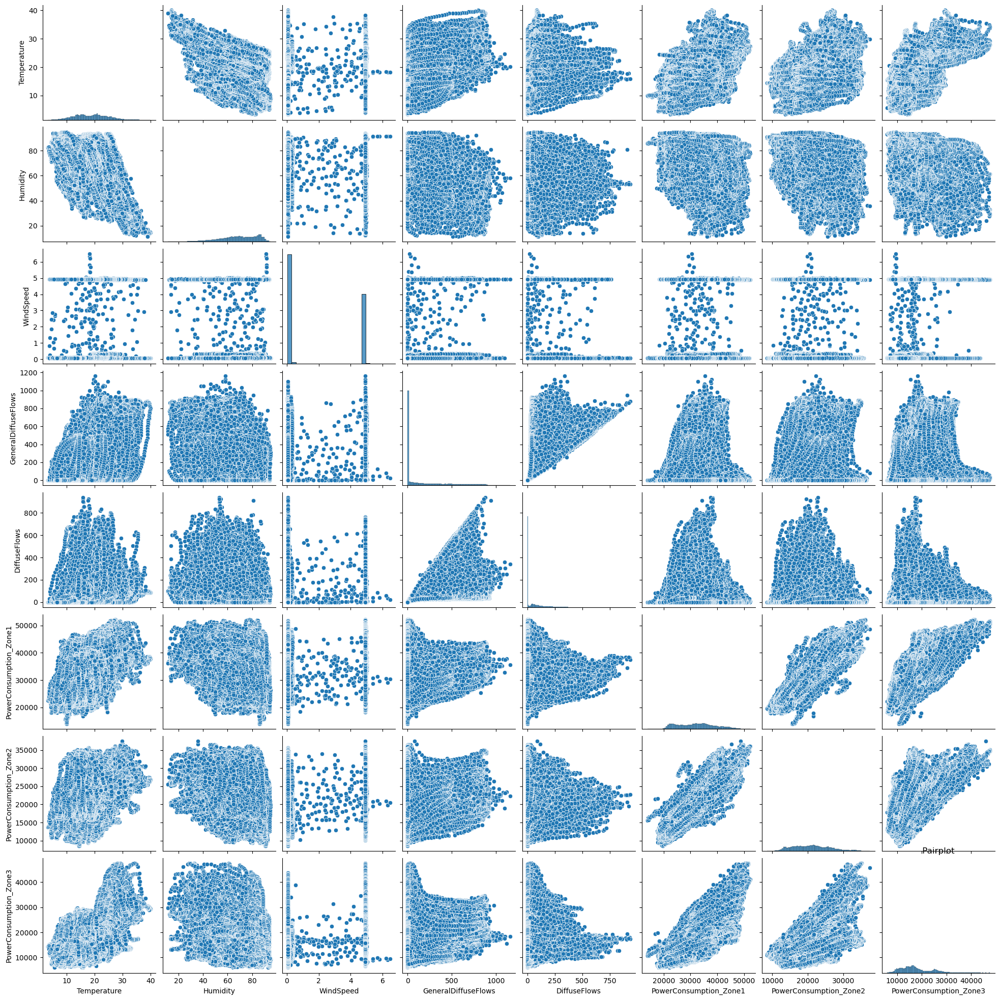

In [10]:
sns.pairplot(power[['Temperature','Humidity','WindSpeed','GeneralDiffuseFlows','DiffuseFlows','PowerConsumption_Zone1','PowerConsumption_Zone2','PowerConsumption_Zone3']])
plt.title(" Pairplot " )
plt.show()

FEATURE ENGINEERING 

In [11]:
#convert Datetime column datatype as DateTime
power['Datetime'] = pd.to_datetime(power['Datetime']) 

In [12]:
power.dtypes

Datetime                  datetime64[ns]
Temperature                      float64
Humidity                         float64
WindSpeed                        float64
GeneralDiffuseFlows              float64
DiffuseFlows                     float64
PowerConsumption_Zone1           float64
PowerConsumption_Zone2           float64
PowerConsumption_Zone3           float64
dtype: object

In [13]:
#creating new features
power['Year'] = pd.to_datetime(power['Datetime']).dt.year 
power['Month'] = pd.to_datetime(power['Datetime']).dt.month
power['Day'] = pd.to_datetime(power['Datetime']).dt.day
power['Hour'] = pd.to_datetime(power['Datetime']).dt.hour
power['Minute'] = pd.to_datetime(power['Datetime']).dt.minute
power['Date'] = pd.to_datetime(power['Datetime']).dt.date
power['Time'] = pd.to_datetime(power['Datetime']).dt.time
power['Week'] = pd.to_datetime(power['Datetime']).dt.isocalendar().week
# Convert to integer
power['Week'] = power['Week'].astype(int)
power.head()

,Datetime,Temperature,Humidity,WindSpeed,GeneralDiffuseFlows,DiffuseFlows,PowerConsumption_Zone1,PowerConsumption_Zone2,PowerConsumption_Zone3,Year,Month,Day,Hour,Minute,Date,Time,Week
0,2017-01-01 00:00:00,6.559,73.8,0.083,0.051,0.119,34055.69620,16128.87538,20240.96386,2017,1,1,0,0,2017-01-01,00:00:00,52
1,2017-01-01 00:10:00,6.414,74.5,0.083,0.070,0.085,29814.68354,19375.07599,20131.08434,2017,1,1,0,10,2017-01-01,00:10:00,52
2,2017-01-01 00:20:00,6.313,74.5,0.080,0.062,0.100,29128.10127,19006.68693,19668.43373,2017,1,1,0,20,2017-01-01,00:20:00,52
3,2017-01-01 00:30:00,6.121,75.0,0.083,0.091,0.096,28228.86076,18361.09422,18899.27711,2017,1,1,0,30,2017-01-01,00:30:00,52
4,2017-01-01 00:40:00,5.921,75.7,0.081,0.048,0.085,27335.69620,17872.34043,18442.40964,2017,1,1,0,40,2017-01-01,00:40:00,52


In [14]:
power['PowerConsumption_Zone'] = power[['PowerConsumption_Zone1', 'PowerConsumption_Zone2', 'PowerConsumption_Zone3']].mean(axis=1)

In [15]:
power['Year'].unique()   # Only 2017 data presented 

array([2017])

DATA VISUALIZATIONS 

In [16]:
# Convert 'Time' column to strings
power['Time'] = power['Datetime'].dt.strftime('%H:%M:%S')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


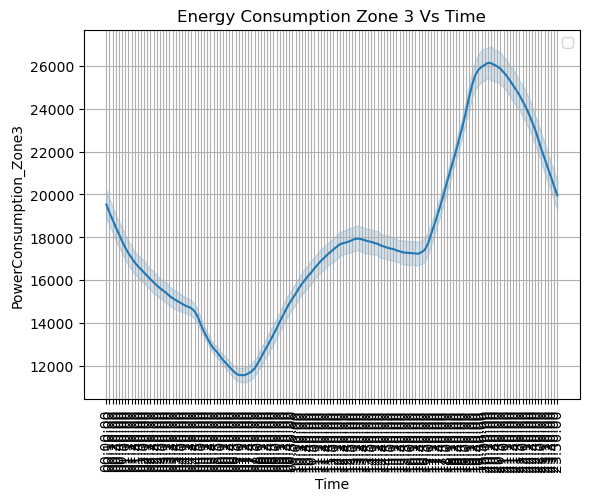

In [17]:
# Plot
fig =plt.figure()
ax1 = sns.lineplot(x='Time', y='PowerConsumption_Zone3', data=power)
plt.title("Energy Consumption Zone 3 Vs Time")
plt.xlabel("Time")
plt.grid(True, alpha =1)
plt.legend()

for label in ax1.xaxis.get_ticklabels():
    label.set_rotation(90)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


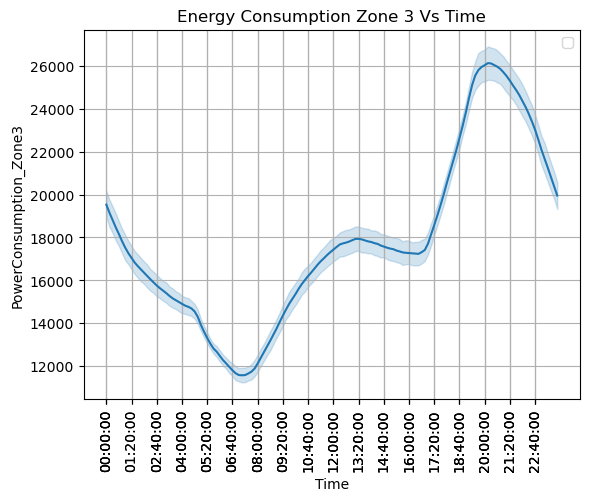

In [18]:

fig = plt.figure()
ax1 = sns.lineplot(x='Time', y='PowerConsumption_Zone3', data=power)
plt.title("Energy Consumption Zone 3 Vs Time")
plt.xlabel("Time")
plt.grid(True, alpha=1)
plt.legend()

for label in ax1.xaxis.get_ticklabels():
    label.set_rotation(90)
plt.xticks(power['Time'][::1000])  # Display every 1000th value
plt.show()


In [19]:
numerical_columns = power.select_dtypes(include=['number'])

In [20]:
num_rows = -(-len(numerical_columns.columns) // 2)  
num_rows

8

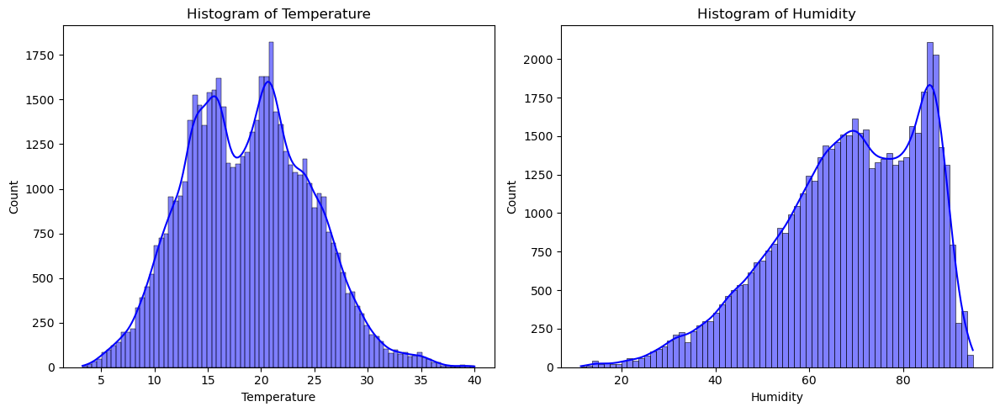

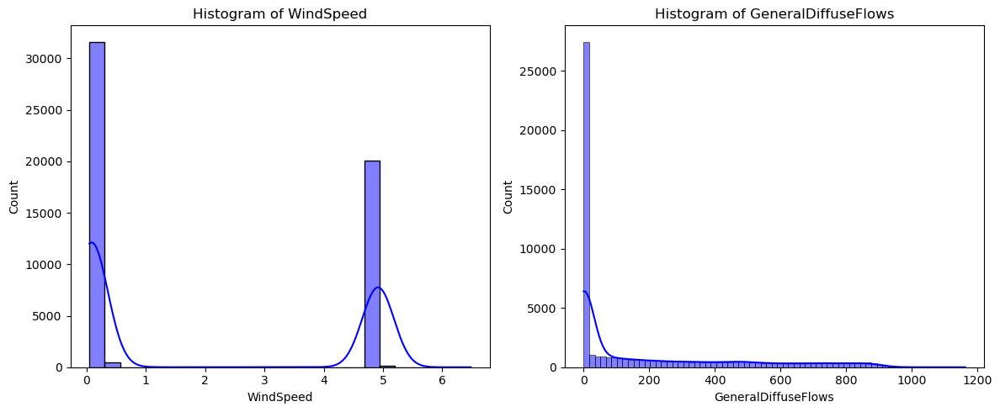

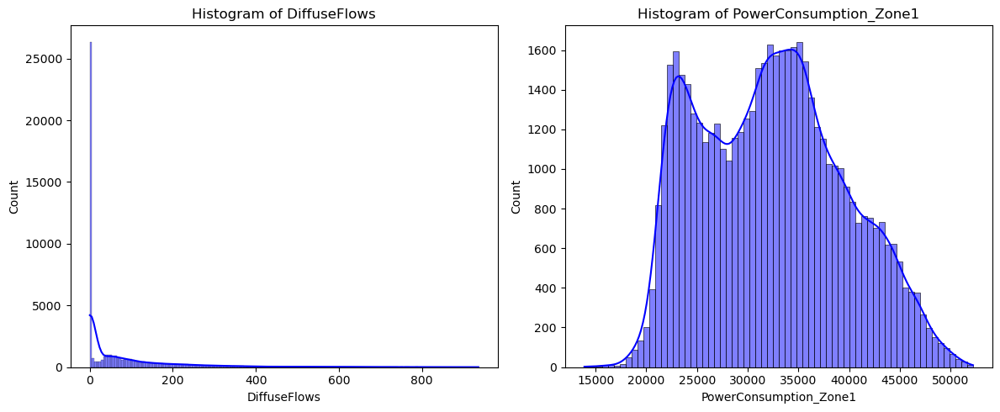

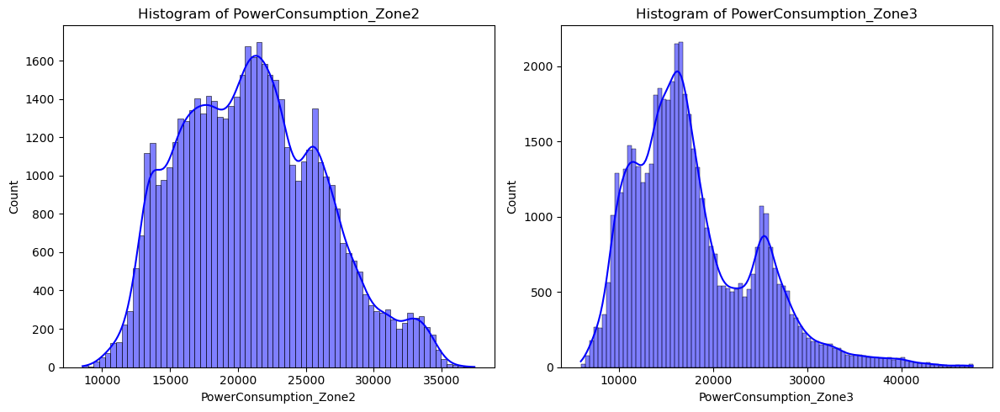

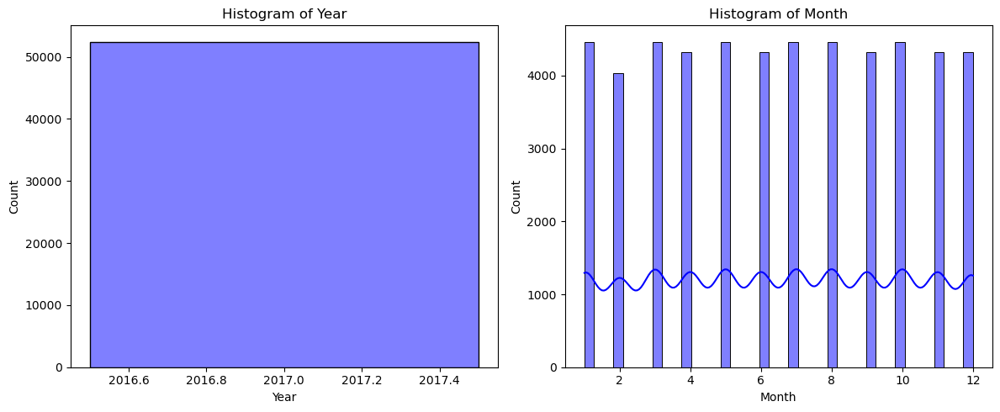

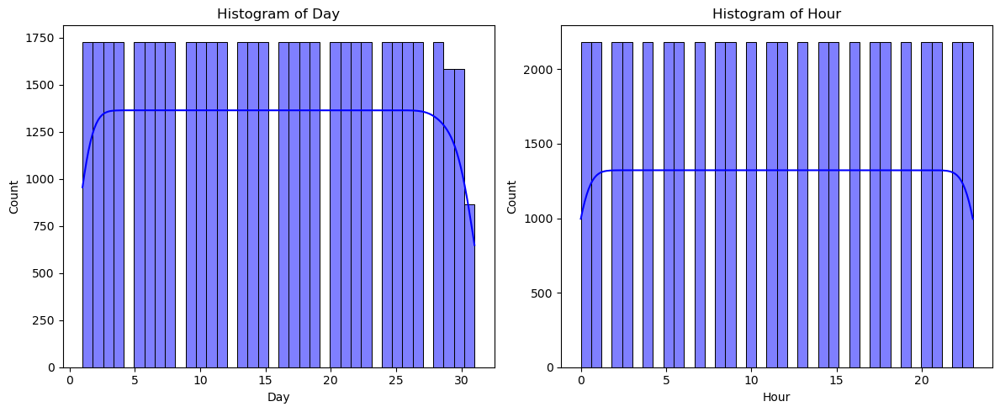

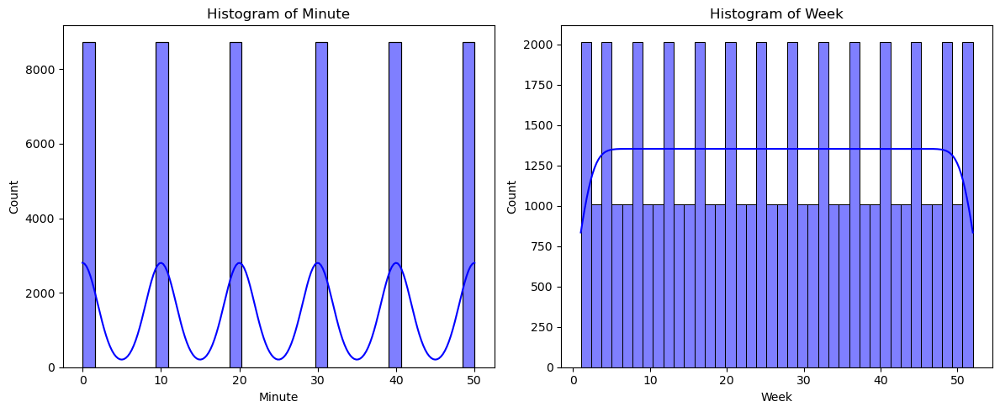

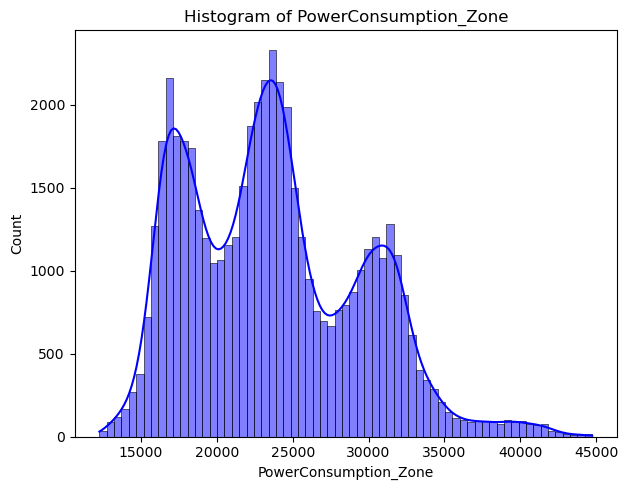

In [21]:
# Iterate  numerical columns in pairs
for i in range(0, len(numerical_columns.columns), 2):
    # Create a new figure with two subplots
    plt.figure(figsize=(12, 5))
    
    # Plot histogram for the first column
    plt.subplot(1, 2, 1)
    sns.histplot(x=numerical_columns.iloc[:, i], kde=True, color='blue', edgecolor='black')
    plt.title(f'Histogram of {numerical_columns.columns[i]}')
    
    # Check if there's a second column available
    if i + 1 < len(numerical_columns.columns):
        # Plot histogram for the second column
        plt.subplot(1, 2, 2)
        sns.histplot(x=numerical_columns.iloc[:, i + 1], kde=True, color='blue', edgecolor='black')
        plt.title(f'Histogram of {numerical_columns.columns[i + 1]}')
    plt.tight_layout()
    plt.show()


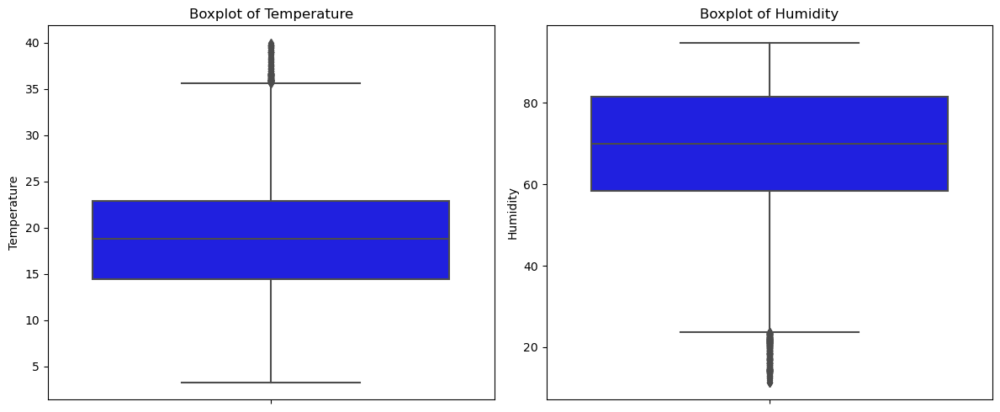

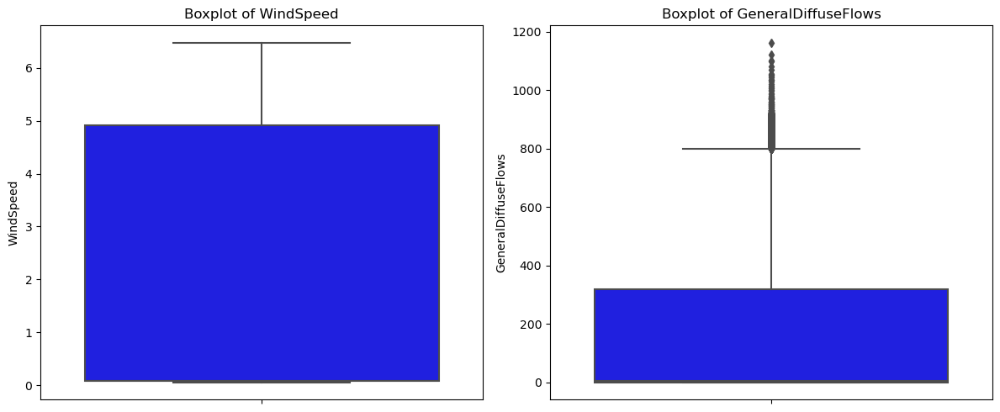

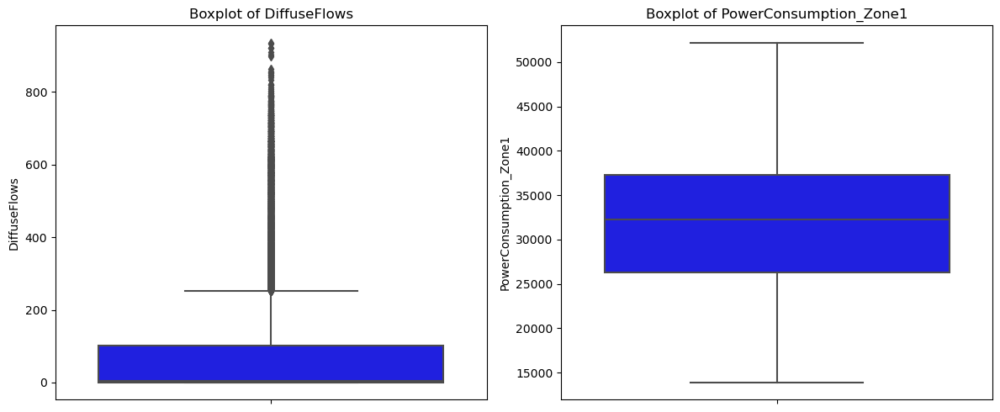

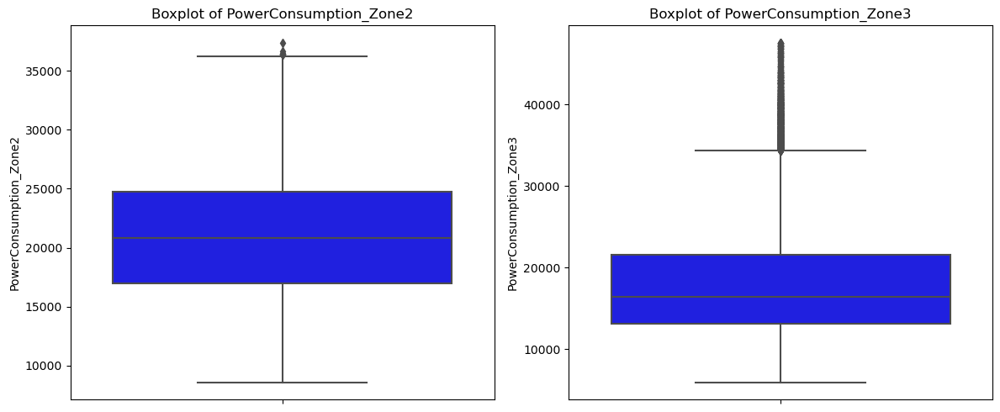

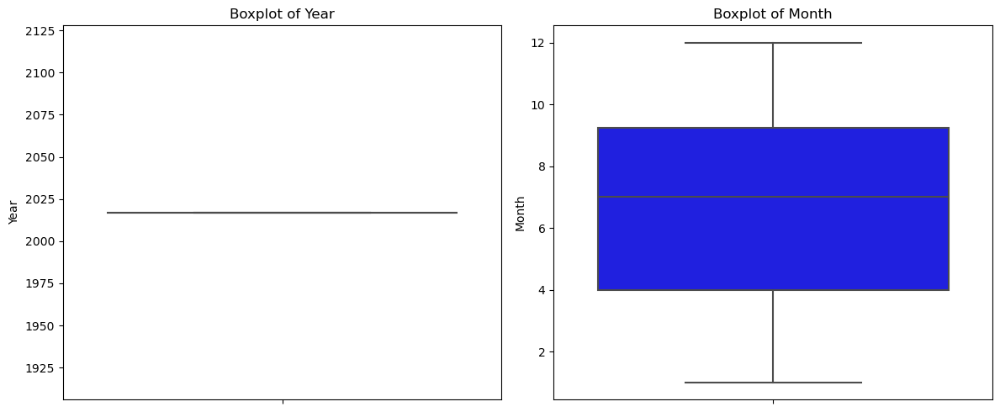

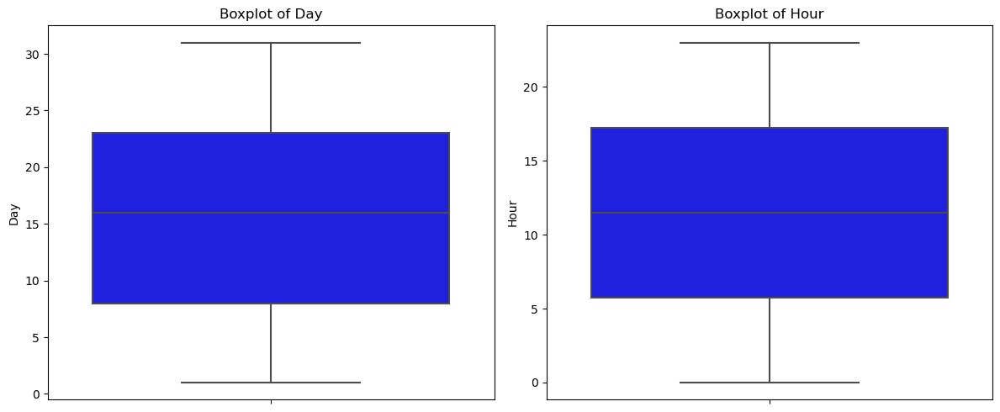

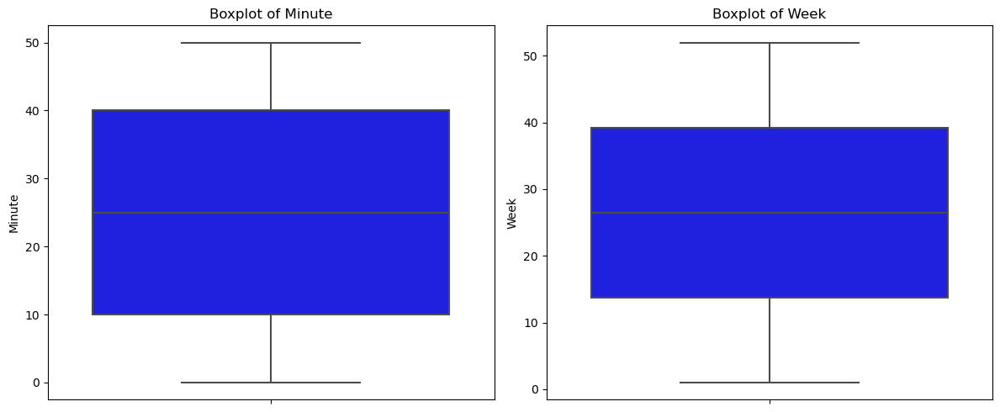

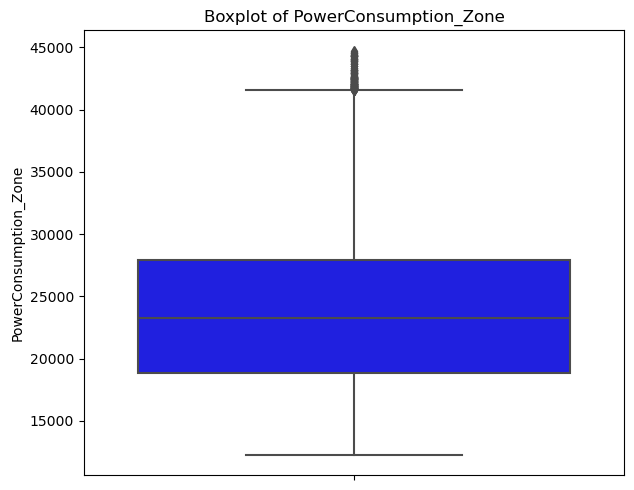

In [22]:
# Iterate over numerical columns in pairs
for i in range(0, len(numerical_columns.columns), 2):
    # Create a new figure with two subplots
    plt.figure(figsize=(12, 5))
    
    # Plot histogram for the first column
    plt.subplot(1, 2, 1)
    sns.boxplot(y=numerical_columns.iloc[:, i], color='blue')
    plt.title(f'Boxplot of {numerical_columns.columns[i]}')
    
    # Check if there's a second column available
    if i + 1 < len(numerical_columns.columns):
        # Plot histogram for the second column
        plt.subplot(1, 2, 2)
        sns.boxplot(y=numerical_columns.iloc[:, i + 1], color='blue')
        plt.title(f'Boxplot of {numerical_columns.columns[i + 1]}')
    plt.tight_layout()
    plt.show()

Note:
1) Outliers are present but i will not remove because it is crucial to reomve, outliers here plays important role for energy consumption 

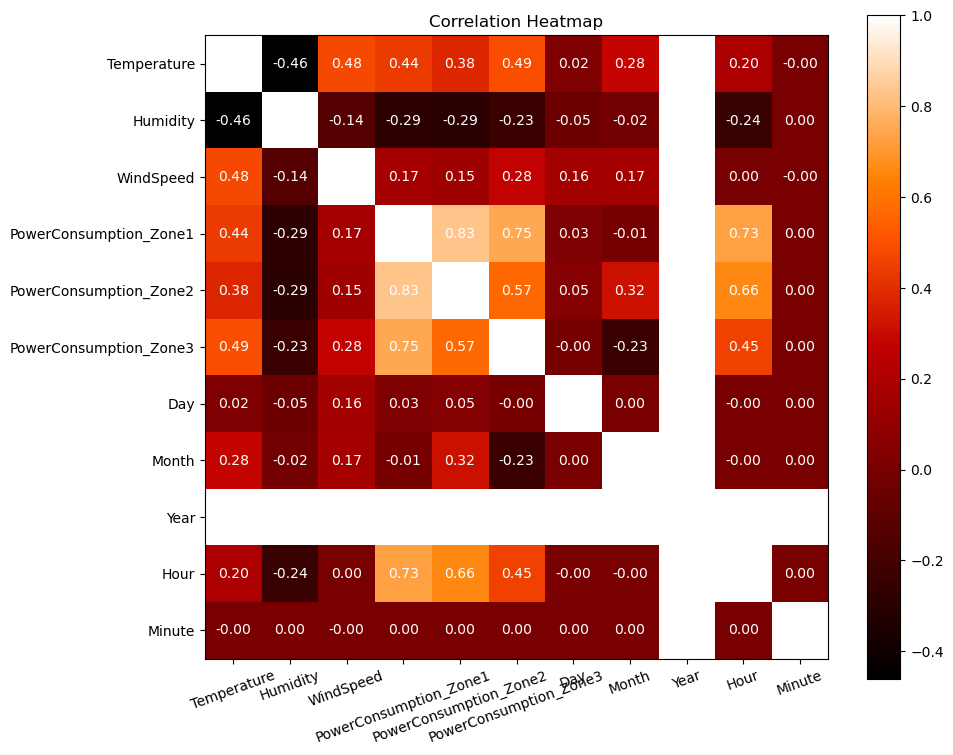

In [23]:
# Calculate correlation matrix
correlation_matrix = power[['Temperature', 'Humidity', 'WindSpeed', 'PowerConsumption_Zone1', 'PowerConsumption_Zone2', 'PowerConsumption_Zone3','Day','Month','Year','Hour','Minute']].corr()
# Create heatmap
plt.figure(figsize=(10, 8))
heatmap = plt.imshow(correlation_matrix, cmap='gist_heat', interpolation='nearest')
plt.colorbar(heatmap)
plt.title('Correlation Heatmap')

# Add text annotation
for i in range(len(correlation_matrix.columns)):
    for j in range(len(correlation_matrix.index)):
        plt.text(j, i, '{:.2f}'.format(correlation_matrix.iloc[i, j]), ha='center', va='center', color='white')

plt.xticks(np.arange(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=20)
plt.yticks(np.arange(len(correlation_matrix.index)), correlation_matrix.index)
plt.tight_layout()
plt.show()


In [24]:
# Randomly sample a subset of data
sampled_power = power.sample(n=1000) 

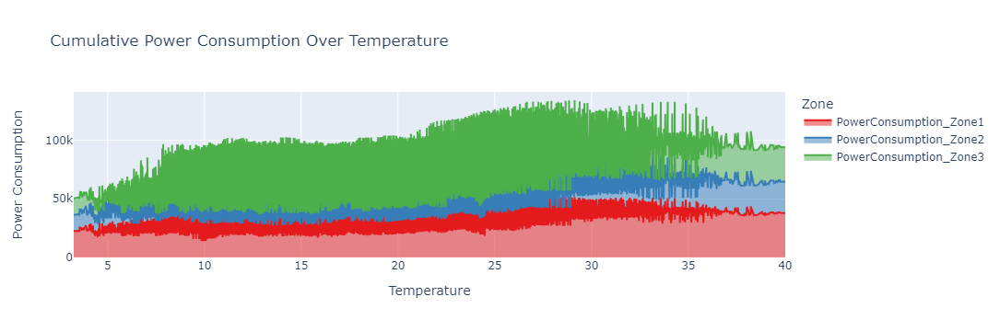

In [25]:
fig = px.area(power, x='Temperature',
              y=['PowerConsumption_Zone1', 'PowerConsumption_Zone2', 'PowerConsumption_Zone3'],
              title='Cumulative Power Consumption Over Temperature',
              labels={'value': 'Power Consumption', 'variable': 'Zone'},
              color_discrete_sequence=px.colors.qualitative.Set1)

# Show the plot
fig.show()

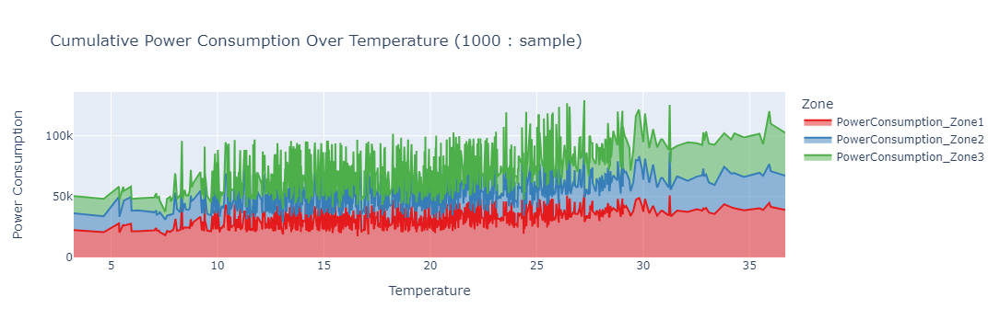

In [26]:
fig = px.area(sampled_power, x='Temperature',
              y=['PowerConsumption_Zone1', 'PowerConsumption_Zone2', 'PowerConsumption_Zone3'],
              title='Cumulative Power Consumption Over Temperature (1000 : sample)',
              labels={'value': 'Power Consumption', 'variable': 'Zone'},
              color_discrete_sequence=px.colors.qualitative.Set1)

# Show the plot
fig.show()

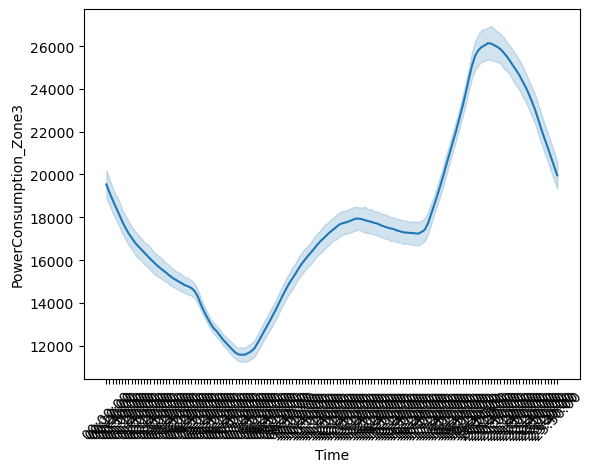

In [27]:
sns.lineplot(x='Time',y='PowerConsumption_Zone3',data=power)
plt.xticks(rotation=45) 
plt.show()

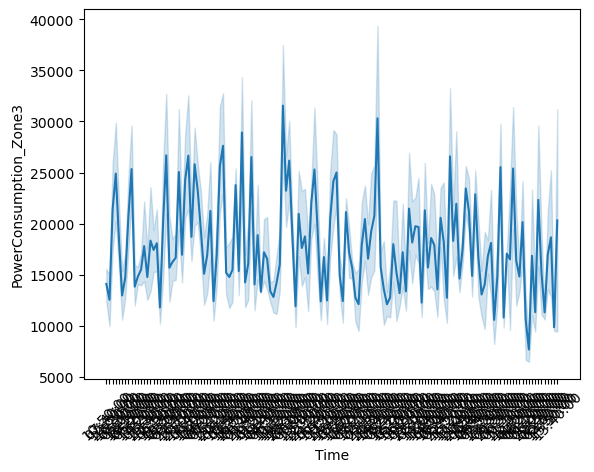

In [32]:
sns.lineplot(x='Time',y='PowerConsumption_Zone3',data=sampled_power)
plt.xticks(rotation=45) 
plt.show()

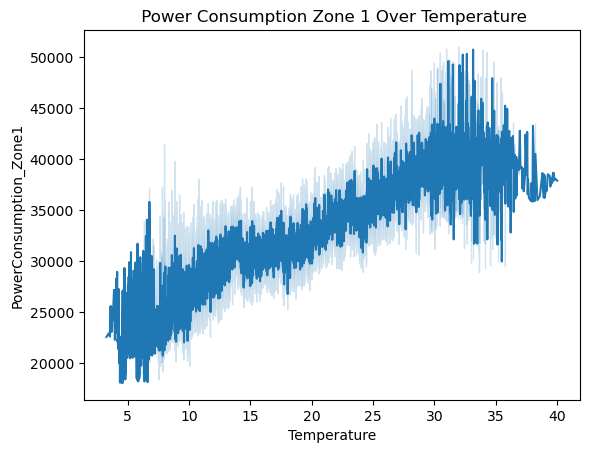

In [33]:
sns.lineplot(data=power,x='Temperature',y='PowerConsumption_Zone1')
plt.title(" Power Consumption Zone 1 Over Temperature")
plt.show()

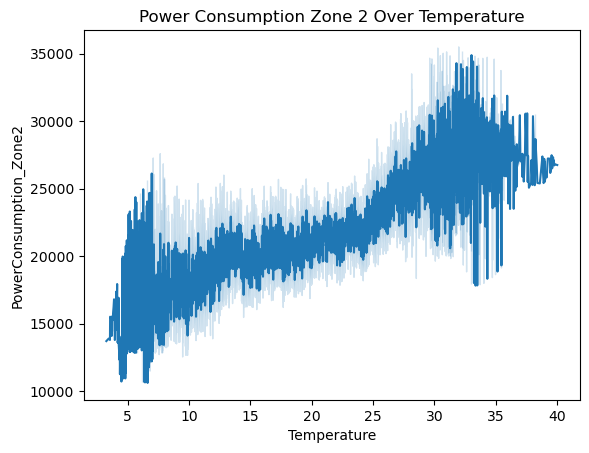

In [34]:
sns.lineplot(data=power,x='Temperature',y='PowerConsumption_Zone2')
plt.title("Power Consumption Zone 2 Over Temperature")
plt.show()

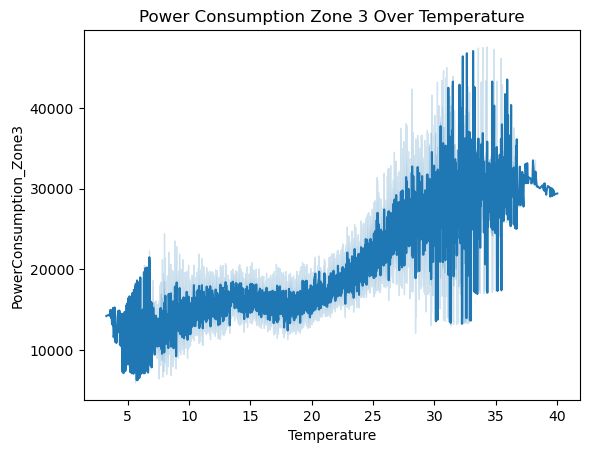

In [35]:
sns.lineplot(data=power,x='Temperature',y='PowerConsumption_Zone3')
plt.title("Power Consumption Zone 3 Over Temperature")
plt.show()

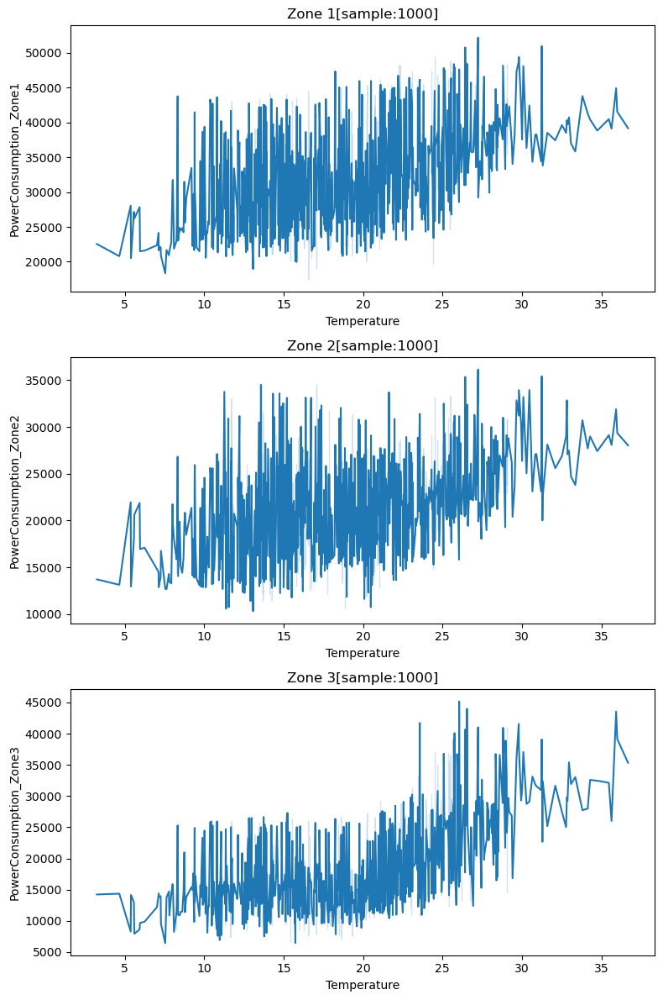

In [36]:
# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

# Plot Zone 1
sns.lineplot(data=sampled_power, x='Temperature', y='PowerConsumption_Zone1', ax=axs[0])
axs[0].set_title('Zone 1[sample:1000]')

# Plot Zone 2
sns.lineplot(data=sampled_power, x='Temperature', y='PowerConsumption_Zone2', ax=axs[1])
axs[1].set_title('Zone 2[sample:1000]')

# Plot Zone 3
sns.lineplot(data=sampled_power, x='Temperature', y='PowerConsumption_Zone3', ax=axs[2])
axs[2].set_title('Zone 3[sample:1000]')

plt.tight_layout()
plt.show()

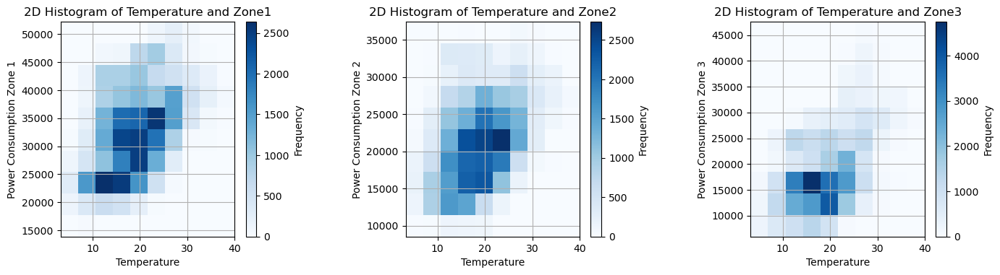

In [37]:

# Create subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot the first histogram
axs[0].hist2d(data=power, x='Temperature', y='PowerConsumption_Zone1', bins=10, cmap='Blues')
axs[0].set_xlabel('Temperature')
axs[0].set_ylabel('Power Consumption Zone 1')
axs[0].set_title('2D Histogram of Temperature and Zone1')
axs[0].grid(True)
fig.colorbar(axs[0].collections[0], ax=axs[0], label='Frequency')

# Plot the second histogram
axs[1].hist2d(data=power, x='Temperature', y='PowerConsumption_Zone2', bins=10, cmap='Blues')
axs[1].set_xlabel('Temperature')
axs[1].set_ylabel('Power Consumption Zone 2')
axs[1].set_title('2D Histogram of Temperature and Zone2')
axs[1].grid(True)
fig.colorbar(axs[1].collections[0], ax=axs[1], label='Frequency')

# Plot the third histogram
axs[2].hist2d(data=power, x='Temperature', y='PowerConsumption_Zone3', bins=10, cmap='Blues')
axs[2].set_xlabel('Temperature')
axs[2].set_ylabel('Power Consumption Zone 3')
axs[2].set_title('2D Histogram of Temperature and Zone3')
axs[2].grid(True)
fig.colorbar(axs[2].collections[0], ax=axs[2], label='Frequency')

plt.tight_layout(pad=5.0) 
plt.show()


Note:
1) As temperature increasing Power Consumption also increases 
2) With comparison to Power Consumption zones, Zone 3 has the highest frequency with respect to temperature 

Futher Analysis is on Zone 3 (Target value)

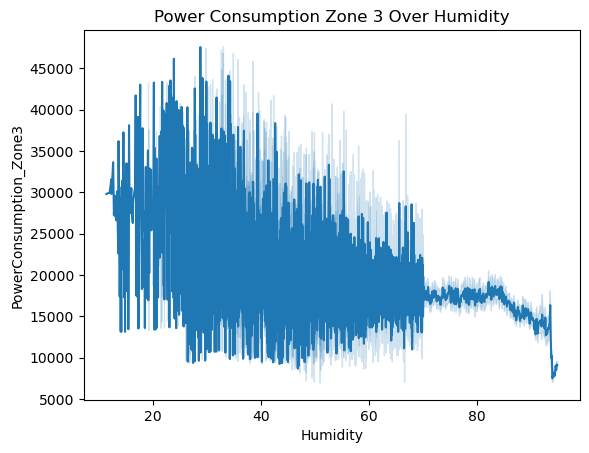

In [38]:
sns.lineplot(data=power,x='Humidity',y='PowerConsumption_Zone3')
plt.title("Power Consumption Zone 3 Over Humidity")
plt.show()

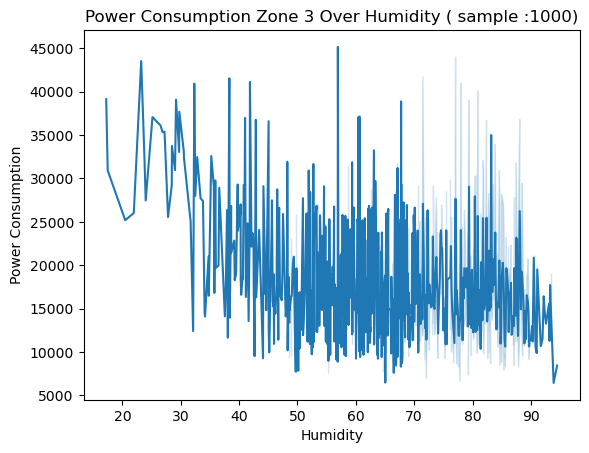

In [39]:
# Plot the lineplot using the sampled data
sns.lineplot(data=sampled_power, x='Humidity', y='PowerConsumption_Zone3')
# Set title and labels
plt.title("Power Consumption Zone 3 Over Humidity ( sample :1000)")
plt.xlabel("Humidity")
plt.ylabel("Power Consumption")

# Show the plot
plt.show()


Note:
1) As Humidity increases Power Consumption decrease 

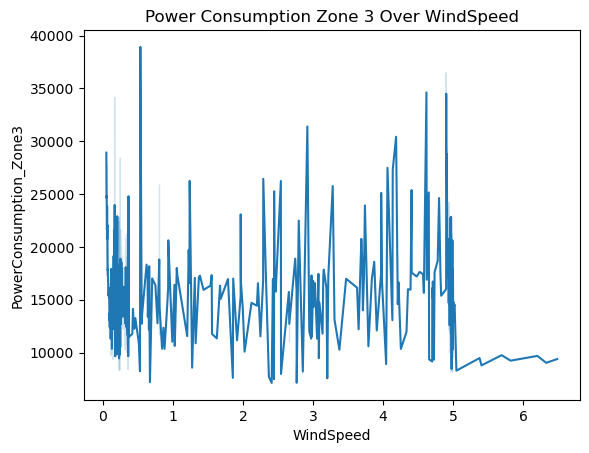

In [40]:
sns.lineplot(data=power,x='WindSpeed',y='PowerConsumption_Zone3')
plt.title("Power Consumption Zone 3 Over WindSpeed")
plt.show()

Note:
1) There no such realtion, but when windspeed is more sometime consumption is less

Text(0.5, 1.0, 'Power Consumption Zone 3 Over  Date')

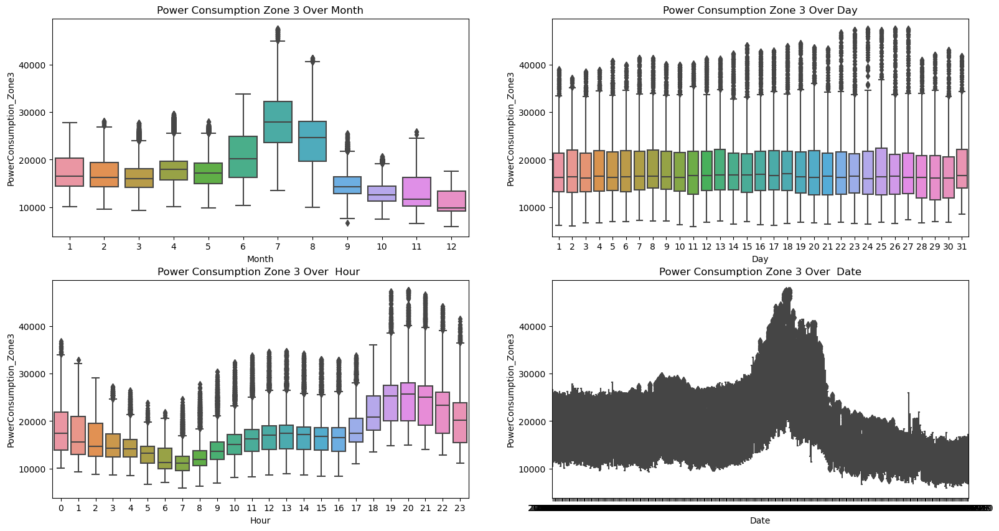

In [41]:
# Create a figure and axes for subplots
fig, axs = plt.subplots(2, 2, figsize=(19, 10))

# Plot 1: Power Consumption Zone 3 Over WindSpeed for Month
sns.boxplot(data=power, x='Month', y='PowerConsumption_Zone3', ax=axs[0, 0])
axs[0, 0].set_title("Power Consumption Zone 3 Over Month")

# Plot 2: Power Consumption Zone 3 Over WindSpeed for Day
sns.boxplot(data=power, x='Day', y='PowerConsumption_Zone3', ax=axs[0, 1])
axs[0, 1].set_title("Power Consumption Zone 3 Over Day")

# Plot 3: Power Consumption Zone 3 Over WindSpeed for Hour
sns.boxplot(data=power, x='Hour', y='PowerConsumption_Zone3', ax=axs[1, 0])
axs[1, 0].set_title("Power Consumption Zone 3 Over  Hour ")

# Plot 4: Power Consumption Zone 3 Over WindSpeed for Date
sns.boxplot(data=power, x='Date', y='PowerConsumption_Zone3', ax=axs[1, 1])
axs[1, 1].set_title("Power Consumption Zone 3 Over  Date")




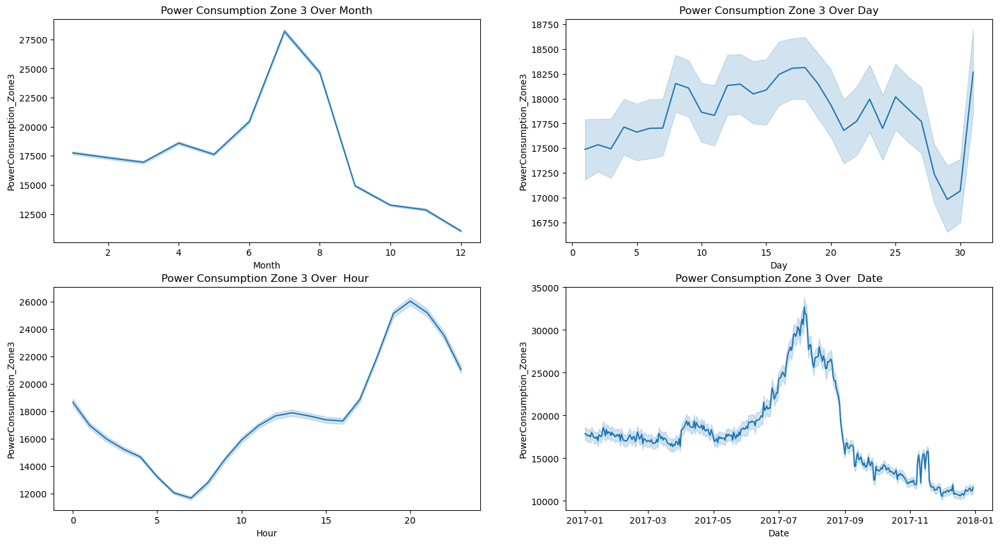

In [42]:
# Create a figure and axes for subplots
fig, axs = plt.subplots(2, 2, figsize=(19, 10))

# Plot 1: Power Consumption Zone 3 Over WindSpeed for Month
sns.lineplot(data=power, x='Month', y='PowerConsumption_Zone3', ax=axs[0, 0])
axs[0, 0].set_title("Power Consumption Zone 3 Over Month")

# Plot 2: Power Consumption Zone 3 Over WindSpeed for Day
sns.lineplot(data=power, x='Day', y='PowerConsumption_Zone3', ax=axs[0, 1])
axs[0, 1].set_title("Power Consumption Zone 3 Over Day")

# Plot 3: Power Consumption Zone 3 Over WindSpeed for Hour
sns.lineplot(data=power, x='Hour', y='PowerConsumption_Zone3', ax=axs[1, 0])
axs[1, 0].set_title("Power Consumption Zone 3 Over  Hour ")

# Plot 4: Power Consumption Zone 3 Over WindSpeed for Date
sns.lineplot(data=power, x='Date', y='PowerConsumption_Zone3', ax=axs[1, 1])
axs[1, 1].set_title("Power Consumption Zone 3 Over  Date")


# Show the plots
plt.show()


Note:
1) Power Consumption Increases from month 6 - 8, highest consumption is highest in the month of 7
2) Days between 5 - 21 power consumption rate is probably highest
3) After 6-7  power consumption is less  , and after 17 it increased
 >Power consumption decreases during the daytime, particularly from 6 AM to 7 PM. This reduction is likely because people are away at work or school,
leading to fewer household appliances being used.
>Power consumption increases significantly after 5 PM and remains high during the night. This pattern can be attributed to the use
of appliances such as air conditioners, fans, and lights, as people return home and engage in various activities


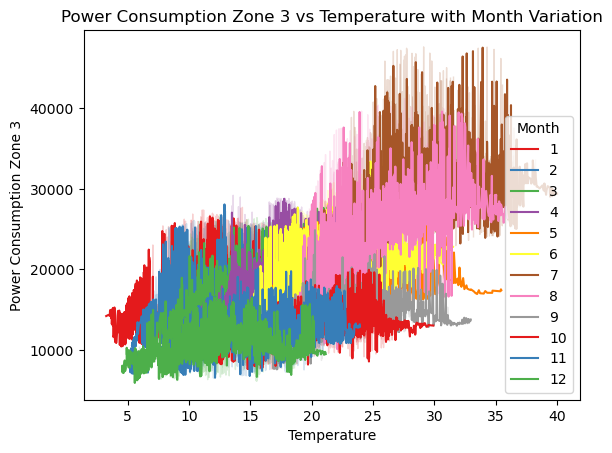

In [43]:
sns.lineplot(data=power, x='Temperature', y='PowerConsumption_Zone3', hue='Month',palette='Set1')
plt.xlabel('Temperature')
plt.ylabel('Power Consumption Zone 3')
plt.title('Power Consumption Zone 3 vs Temperature with Month Variation')
plt.show()

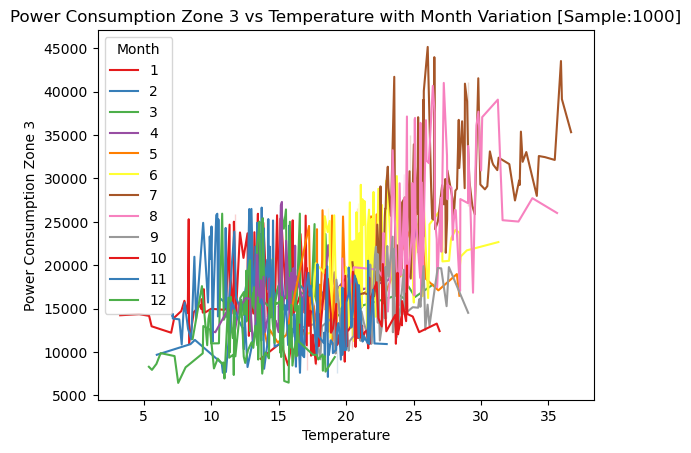

In [100]:
sns.lineplot(data=sampled_power, x='Temperature', y='PowerConsumption_Zone3', hue='Month',palette='Set1')
plt.xlabel('Temperature')
plt.ylabel('Power Consumption Zone 3')
plt.title('Power Consumption Zone 3 vs Temperature with Month Variation [Sample:1000]')
plt.show()

Note:
1) In the month of 7 Temperature is increased due to which power consumption also increased 

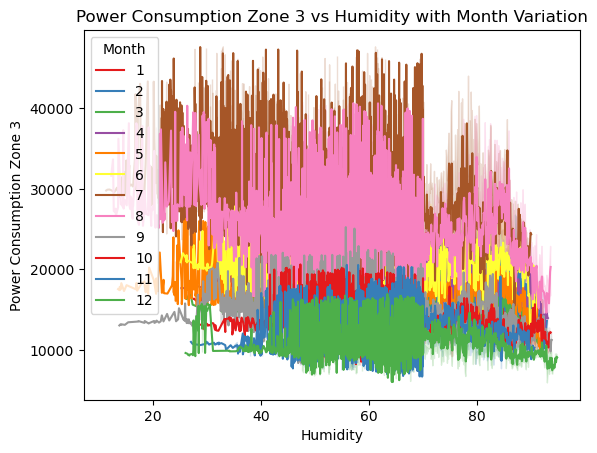

In [45]:
sns.lineplot(data=power, x='Humidity', y='PowerConsumption_Zone3', hue='Month',palette='Set1')
plt.xlabel('Humidity')
plt.ylabel('Power Consumption Zone 3')
plt.title('Power Consumption Zone 3 vs Humidity with Month Variation')
plt.show()

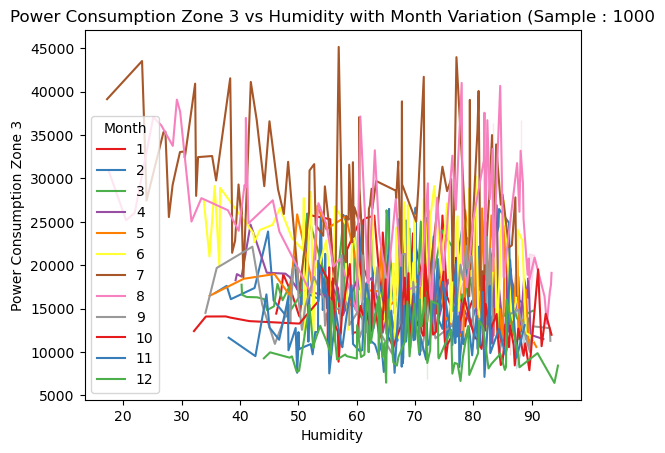

In [46]:
sns.lineplot(data=sampled_power, x='Humidity', y='PowerConsumption_Zone3', hue='Month',palette='Set1')
plt.xlabel('Humidity')
plt.ylabel('Power Consumption Zone 3')
plt.title('Power Consumption Zone 3 vs Humidity with Month Variation (Sample : 1000))
plt.show()

Note:
1) Humidity is more present in the month of 7 ,8  this could be also reason to increases the power consumption 

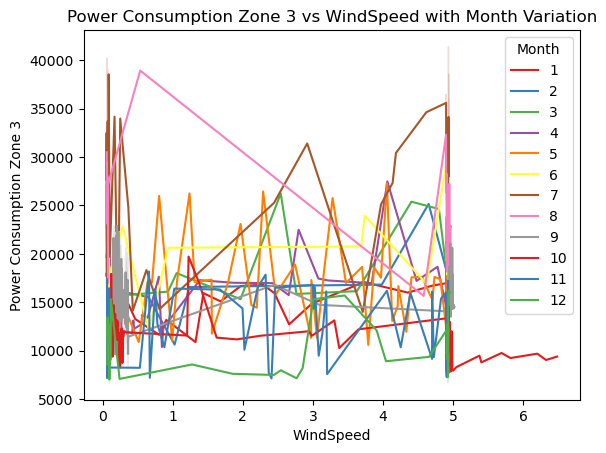

In [47]:
sns.lineplot(data=power, x='WindSpeed', y='PowerConsumption_Zone3', hue='Month',palette='Set1')
plt.xlabel('WindSpeed')
plt.ylabel('Power Consumption Zone 3')
plt.title('Power Consumption Zone 3 vs WindSpeed with Month Variation')
plt.show()

Note:
1) Wind Speed is highest in the month of 8 followed by 7 

<Axes: xlabel='GeneralDiffuseFlows', ylabel='PowerConsumption_Zone3'>

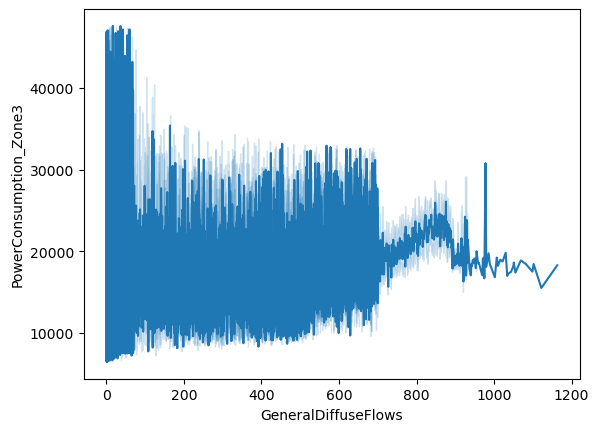

In [48]:
sns.lineplot(data=power, x='GeneralDiffuseFlows',y='PowerConsumption_Zone3')

<Axes: xlabel='GeneralDiffuseFlows', ylabel='PowerConsumption_Zone3'>

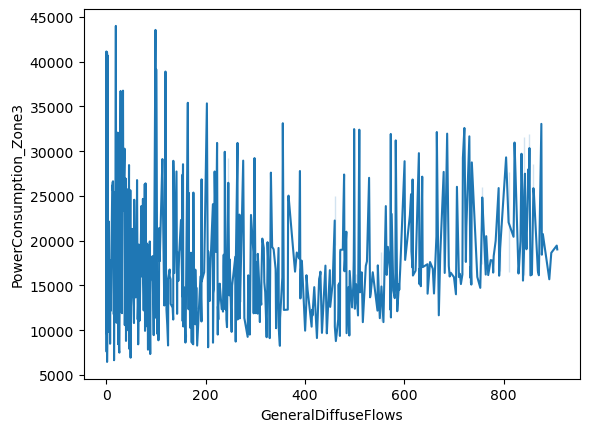

In [49]:
sns.lineplot(data=sampled_power, x='GeneralDiffuseFlows',y='PowerConsumption_Zone3')

Note:
1) Power consumption is less when General Diffuse Flows is more 
2) Power consumption is less in value's between 200 - 550


<Axes: xlabel='DiffuseFlows', ylabel='PowerConsumption_Zone3'>

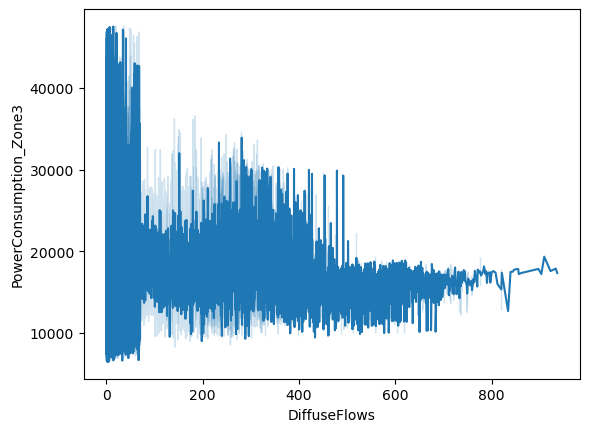

In [50]:
sns.lineplot(data=power, x='DiffuseFlows',y='PowerConsumption_Zone3')

<Axes: xlabel='DiffuseFlows', ylabel='PowerConsumption_Zone3'>

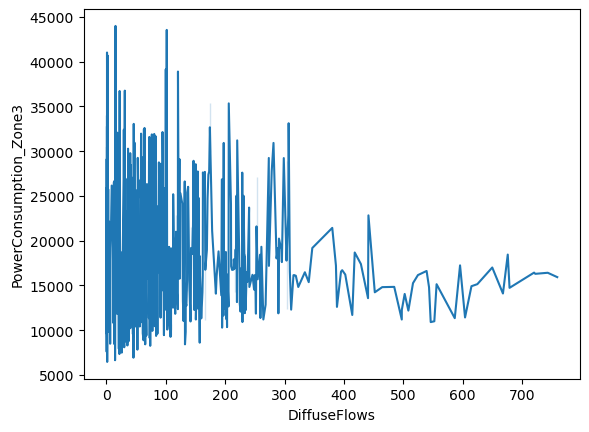

In [51]:
sns.lineplot(data=sampled_power, x='DiffuseFlows',y='PowerConsumption_Zone3')

Note:
1) Power consumption is less when Diffuse Flows is more 
2) Power consumption is less in value's between 400 - 600

FEATURE SELECTION

In [52]:
from sklearn.ensemble import RandomForestRegressor
# Convert 'Date' column to datetime format
power['Date'] = pd.to_datetime(power['Date'])

numeric_columns = power.select_dtypes(include=['float64', 'int32'])

# Split the data into features (X) and target variable (y)
X = numeric_columns.drop(['PowerConsumption_Zone3'], axis=1)  # Exclude target variable
y = power['PowerConsumption_Zone3']

# Initialize the RandomForestRegressor model
model = RandomForestRegressor()

# Fit the model on the data
model.fit(X, y)

# Extract feature importances
feature_importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)

print("Features ranked by importance in descending order:")
print(feature_importances)





Features ranked by importance in descending order:
PowerConsumption_Zone     0.750599
Week                      0.173654
Month                     0.024406
Hour                      0.012590
GeneralDiffuseFlows       0.009444
PowerConsumption_Zone1    0.008839
PowerConsumption_Zone2    0.008374
DiffuseFlows              0.005341
Day                       0.003106
Temperature               0.002054
Humidity                  0.000778
WindSpeed                 0.000568
Minute                    0.000247
Year                      0.000000
dtype: float64


Deep Learning 

In [53]:
data=power.copy()

In [54]:
data.set_index('Datetime', inplace=True)

In [55]:
data.dtypes

Temperature                      float64
Humidity                         float64
WindSpeed                        float64
GeneralDiffuseFlows              float64
DiffuseFlows                     float64
PowerConsumption_Zone1           float64
PowerConsumption_Zone2           float64
PowerConsumption_Zone3           float64
Year                               int32
Month                              int32
Day                                int32
Hour                               int32
Minute                             int32
Date                      datetime64[ns]
Time                              object
Week                               int32
PowerConsumption_Zone            float64
dtype: object

In [56]:
print(data.columns)

Index(['Temperature', 'Humidity', 'WindSpeed', 'GeneralDiffuseFlows',
       'DiffuseFlows', 'PowerConsumption_Zone1', 'PowerConsumption_Zone2',
       'PowerConsumption_Zone3', 'Year', 'Month', 'Day', 'Hour', 'Minute',
       'Date', 'Time', 'Week', 'PowerConsumption_Zone'],
      dtype='object')


In [57]:
columns_to_drop = ['Year', 'Month', 'Day', 'Hour', 'Minute', 'Date', 'Time', 'Week', 'PowerConsumption_Zone']
data.drop(columns=[col for col in columns_to_drop if col in data.columns], inplace=True)
print(data.columns)

Index(['Temperature', 'Humidity', 'WindSpeed', 'GeneralDiffuseFlows',
       'DiffuseFlows', 'PowerConsumption_Zone1', 'PowerConsumption_Zone2',
       'PowerConsumption_Zone3'],
      dtype='object')


In [58]:
#Resample the data on the basis of day's
data_final=data.resample('D').mean()
data_final.head(3)

,Temperature,Humidity,WindSpeed,GeneralDiffuseFlows,DiffuseFlows,PowerConsumption_Zone1,PowerConsumption_Zone2,PowerConsumption_Zone3
Datetime,,,,,,,,
2017-01-01,9.675299,68.519306,0.315146,121.390771,25.993924,28465.232067,17737.791287,17868.795181
2017-01-02,12.476875,71.456319,0.076563,120.404486,27.227410,28869.493671,19557.725431,17820.763053
2017-01-03,12.100000,74.981667,0.076715,120.686014,28.574660,30562.447257,20057.269504,17620.803213


In [59]:
x=data_final.drop(['PowerConsumption_Zone3'],axis=1)

In [60]:
y=data_final['PowerConsumption_Zone3']

In [61]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(x,y,test_size = 0.2, random_state = 0)

In [62]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaler=scaler.fit_transform(X_train)
X_test_scaler=scaler.transform(X_test)

In [63]:
print("X_train shape",X_train_scaler.shape)
print("X_test shape",X_test_scaler.shape)
print("Y_train shape",Y_train.shape)
print("Y_test shape",Y_test.shape)

X_train shape (291, 7)
X_test shape (73, 7)
Y_train shape (291,)
Y_test shape (73,)


ANN MODEL

In [64]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
# Define ANN model
model = Sequential()

# input layer and first hidden layer
model.add(Dense(units=64, activation='relu', input_dim=X_train_scaler.shape[1]))
model.add(Dropout(0.2))  
# second hidden layer 
model.add(Dense(units=64, activation='relu'))
model.add(Dropout(0.2))  
# output layer 
model.add(Dense(units=1))
# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mean_absolute_error'])
model.summary()
# early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 64)                  │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,737 (18.50 KB)

 Trainable params: 4,737 (18.50 KB)

 Non-trainable params: 0 (0.00 B)

In [65]:
# Train  model with early stopping
ann_model_history = model.fit(X_train_scaler, Y_train, epochs=100, batch_size=32, validation_data=(X_test_scaler, Y_test), callbacks=[early_stopping])

Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 352432608.0000 - mean_absolute_error: 18109.1602 - val_loss: 327626240.0000 - val_mean_absolute_error: 17542.5508
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 343776864.0000 - mean_absolute_error: 17863.7695 - val_loss: 327592000.0000 - val_mean_absolute_error: 17541.6445
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 349725440.0000 - mean_absolute_error: 17950.0039 - val_loss: 327546080.0000 - val_mean_absolute_error: 17540.4375
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 344193632.0000 - mean_absolute_error: 17864.2246 - val_loss: 327484192.0000 - val_mean_absolute_error: 17538.8145
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 354037248.0000 - mean_absolute_error: 18138.8379 - val_loss: 327402400.0000 - val_mean_absolute_error: 17536.6855
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 343491328.0000 - mean_absolute_error: 17864.8086 - val_loss: 327295584.0000

In [66]:
# Evaluate the model on the test set
test_loss, test_mae = model.evaluate(X_test_scaler, Y_test)
print(f'Test Mean Absolute Error: {test_mae}')

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 24397718.0000 - mean_absolute_error: 4311.9639 
Test Mean Absolute Error: 4332.4404296875


In [67]:
# Make predictions
Y_pred = model.predict(X_test_scaler)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


In [68]:
Y_pred = Y_pred.flatten() if len(Y_pred.shape) > 1 else Y_pred
Y_test = Y_test.flatten() if len(Y_test.shape) > 1 else Y_test

# Create a DataFrame with predicted and actual values as columns
df = pd.DataFrame({'Predicted Values': Y_pred, 'Actual Values': Y_test})

# Display the DataFrame
print(df)

            Predicted Values  Actual Values
Datetime                                   
2017-11-05      14068.722656   12042.168674
2017-09-16       6909.200195   15131.399388
2017-02-15      12032.750977   17535.758794
2017-01-27      11967.488281   17724.016064
2017-08-08      29236.736328   28017.554858
...                      ...            ...
2017-07-18      35513.085938   29595.941422
2017-08-23      24105.871094   24051.577847
2017-10-09       6827.703613   13952.664640
2017-04-24      11109.879883   18183.757575
2017-11-18      11383.456055   15763.895582

[73 rows x 2 columns]


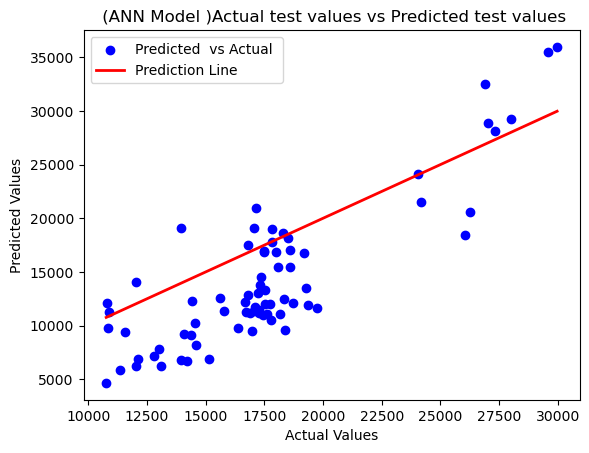

In [69]:
# Scatter plot of actual vs predicted values
plt.scatter(Y_test, Y_pred, color='blue', label='Predicted  vs Actual ')
plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], color='red', linewidth=2, label='Prediction Line')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title(' (ANN Model )Actual test values vs Predicted test values')
plt.legend()
plt.show()


Note:
ANN model result is not satisfied 

LSTM MODEL

In [71]:
from tensorflow.keras.layers import LSTM
#Reshape
X_train = X_train_scaler.reshape((X_train_scaler.shape[0], X_train_scaler.shape[1], 1))
X_test = X_test_scaler.reshape((X_test_scaler.shape[0], X_test_scaler.shape[1], 1))


In [72]:
# Build the LSTM model
model = Sequential()

# Add LSTM layer and first hidden layer
model.add(LSTM(units=64, input_shape=(X_train.shape[1], 1)))
model.add(Dropout(0.2))
# second hidden layer
model.add(Dense(units=32, activation='relu'))
model.add(Dropout(0.2)) 
# Add output layer
model.add(Dense(units=1))
# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')
model.summary()
# Define early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 64)                  │          16,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 19,009 (74.25 KB)

 Trainable params: 19,009 (74.25 KB)

 Non-trainable params: 0 (0.00 B)

In [73]:
# Train the model
lstm_mdel_history = model.fit(X_train, Y_train, epochs=100, batch_size=32, validation_data=(X_test, Y_test), callbacks=[early_stopping])

Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - loss: 340609248.0000 - val_loss: 327668352.0000
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 338639264.0000 - val_loss: 327658272.0000
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 329840128.0000 - val_loss: 327630048.0000
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 347504960.0000 - val_loss: 327540992.0000
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 338064640.0000 - val_loss: 327363360.0000
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 346193056.0000 - val_loss: 327144224.0000
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 338310496.0000 - val_loss: 326836864.0000
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 345289248.0000 - val_loss: 326568192.0000
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 353566048.0000 - val_loss: 326332640.0000
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 345984384.0000 - val_los

In [74]:
# Evaluate the model on the train set
test_loss = model.evaluate(X_test, Y_test)
print(f'Test loss: {test_loss}')

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 227147712.0000 
Test loss: 240978544.0


In [75]:
# Predict the target variable on the train set
Y_pred = model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step


In [76]:
# Calculate Mean Absolute Error (MAE) on the test set
test_mae = np.mean(np.abs(Y_pred.flatten() - Y_test))
print(f'Test Mean Absolute Error: {test_mae}')


Test Mean Absolute Error: 14869.05907549289


In [77]:
Y_pred = Y_pred.flatten() if len(Y_pred.shape) > 1 else Y_pred
Y_test = Y_test.flatten() if len(Y_test.shape) > 1 else Y_test

# Create a DataFrame with predicted and actual values as columns
df = pd.DataFrame({'Predicted Values': Y_pred, 'Actual Values': Y_test})

# Display the DataFrame
print(df)

            Predicted Values  Actual Values
Datetime                                   
2017-11-05       2674.768311   12042.168674
2017-09-16       2674.768311   15131.399388
2017-02-15       2674.750732   17535.758794
2017-01-27       2674.748047   17724.016064
2017-08-08       2674.796631   28017.554858
...                      ...            ...
2017-07-18       2674.790039   29595.941422
2017-08-23       2674.775879   24051.577847
2017-10-09       2674.768799   13952.664640
2017-04-24       2674.759766   18183.757575
2017-11-18       2674.762939   15763.895582

[73 rows x 2 columns]


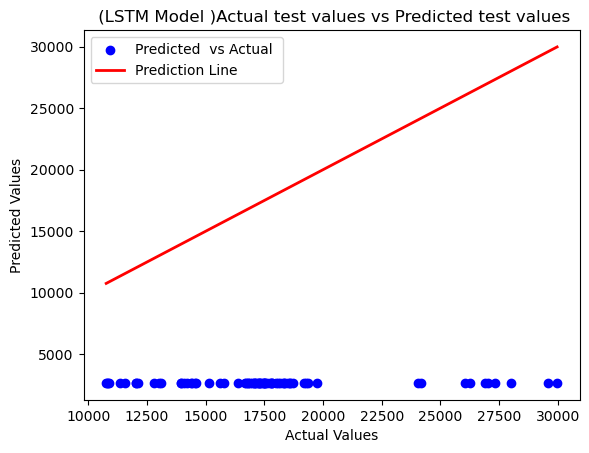

In [78]:
# Scatter plot of actual vs predicted values
plt.scatter(Y_test, Y_pred, color='blue', label='Predicted  vs Actual ')
plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], color='red', linewidth=2, label='Prediction Line')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title(' (LSTM Model )Actual test values vs Predicted test values')
plt.legend()
plt.show()


Note:
LSTM model result is not satisfied 

MACHINE LEARNING 

In [79]:
x=power.drop(['PowerConsumption_Zone3','Time','Date','Datetime','PowerConsumption_Zone'],axis=1)

In [80]:
x.columns

Index(['Temperature', 'Humidity', 'WindSpeed', 'GeneralDiffuseFlows',
       'DiffuseFlows', 'PowerConsumption_Zone1', 'PowerConsumption_Zone2',
       'Year', 'Month', 'Day', 'Hour', 'Minute', 'Week'],
      dtype='object')

In [81]:
y=power['PowerConsumption_Zone3']

In [82]:
X_train,X_test,Y_train,Y_test = train_test_split(x,y,test_size = 0.2, random_state = 0)

In [83]:
scaler = StandardScaler()
X_train_scaler=scaler.fit_transform(X_train)
X_test_scaler=scaler.transform(X_test)

In [84]:
print("X_train shape",X_train_scaler.shape)
print("X_test shape",X_test_scaler.shape)
print("Y_train shape",Y_train.shape)
print("Y_test shape",Y_test.shape)

X_train shape (41932, 13)
X_test shape (10484, 13)
Y_train shape (41932,)
Y_test shape (10484,)


Model1 -- LinearRegression

In [85]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [86]:
# Create the model
lin_reg = LinearRegression()
# Train the model
lin_reg.fit(X_train_scaler, Y_train)
# Make predictions
Y_pred = lin_reg.predict(X_test_scaler)
# Evaluate the model
mse = mean_squared_error(Y_test, Y_pred)
r2 = r2_score(Y_test, Y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")


Mean Squared Error: 9862939.459094305
R^2 Score: 0.7802118926662166


In [87]:
# Create a DataFrame with predicted and actual values as columns
df = pd.DataFrame({'Predicted Values': Y_pred, 'Actual Values': Y_test})

# Display the DataFrame
print(df)

       Predicted Values  Actual Values
25500      18624.684444    21184.98462
40040      15088.379386    13375.80547
35066      13414.183082    13967.55873
27275      17589.647082    23612.38494
3329       13483.973985    14550.36145
...                 ...            ...
9269       15599.536361    12240.00000
33689      25326.707646    29781.06583
21133      21661.547014    20276.59919
40112      18277.038097    13048.99696
7206       16316.915874    15450.69347

[10484 rows x 2 columns]


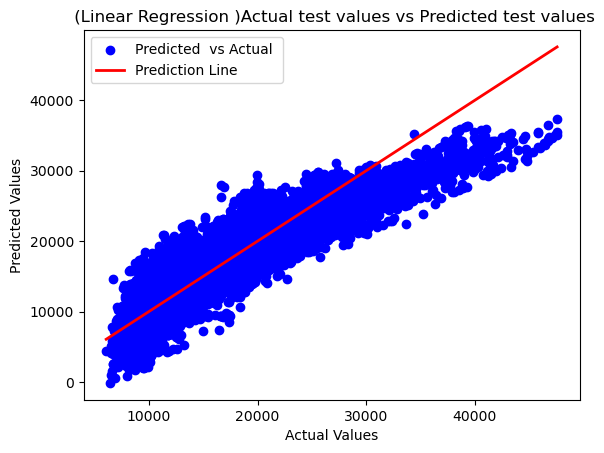

In [88]:
# Scatter plot of actual vs predicted values
plt.scatter(Y_test, Y_pred, color='blue', label='Predicted  vs Actual ')
plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], color='red', linewidth=2, label='Prediction Line')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title(' (Linear Regression )Actual test values vs Predicted test values')
plt.legend()
plt.show()


Model2 -- Decision Tree 

In [89]:
from sklearn.tree import DecisionTreeRegressor
# Create the model
dt = DecisionTreeRegressor()
# Train the model
dt.fit(X_train_scaler, Y_train)
# Make predictions
Y_pred = dt.predict(X_test_scaler)
# Evaluate the model
mse = mean_squared_error(Y_test, Y_pred)
r2 = r2_score(Y_test, Y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 465059.44503993937
R^2 Score: 0.9896365038387436


In [90]:
# Create a DataFrame with predicted and actual values as columns
df = pd.DataFrame({'Predicted Values': Y_pred, 'Actual Values': Y_test})

# Display the DataFrame
print(df)

       Predicted Values  Actual Values
25500       21013.66154    21184.98462
40040       13597.56839    13375.80547
35066       13896.95608    13967.55873
27275       23979.91632    23612.38494
3329        14694.93976    14550.36145
...                 ...            ...
9269        12181.93548    12240.00000
33689       30310.72100    29781.06583
21133       20818.70769    20276.59919
40112       13282.43161    13048.99696
7206        15305.96985    15450.69347

[10484 rows x 2 columns]


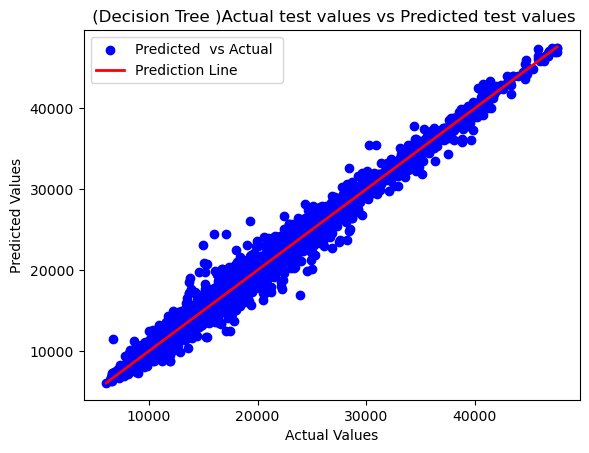

In [91]:
# Scatter plot of actual vs predicted values
plt.scatter(Y_test, Y_pred, color='blue', label='Predicted  vs Actual ')
plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], color='red', linewidth=2, label='Prediction Line')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title(' (Decision Tree )Actual test values vs Predicted test values')
plt.legend()
plt.show()

Model3-- Random Forest 

In [92]:
from sklearn.ensemble import RandomForestRegressor
# Create the model
rf= RandomForestRegressor()
# Train the model
rf.fit(X_train_scaler, Y_train)
# Make predictions
Y_pred = rf.predict(X_test_scaler)
# Evaluate the model
mse = mean_squared_error(Y_test, Y_pred)
r2 = r2_score(Y_test, Y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 213433.6276166402
R^2 Score: 0.9952437938760751


In [94]:
# Create a DataFrame with predicted and actual values as columns
df = pd.DataFrame({'Predicted Values': Y_pred, 'Actual Values': Y_test})
# Display the DataFrame
print(df)

       Predicted Values  Actual Values
25500      20464.504819    21184.98462
40040      12817.002250    13375.80547
35066      13890.601840    13967.55873
27275      23015.970647    23612.38494
3329       14607.281720    14550.36145
...                 ...            ...
9269       12651.491080    12240.00000
33689      30288.270845    29781.06583
21133      21720.974620    20276.59919
40112      13277.922137    13048.99696
7206       15585.817930    15450.69347

[10484 rows x 2 columns]


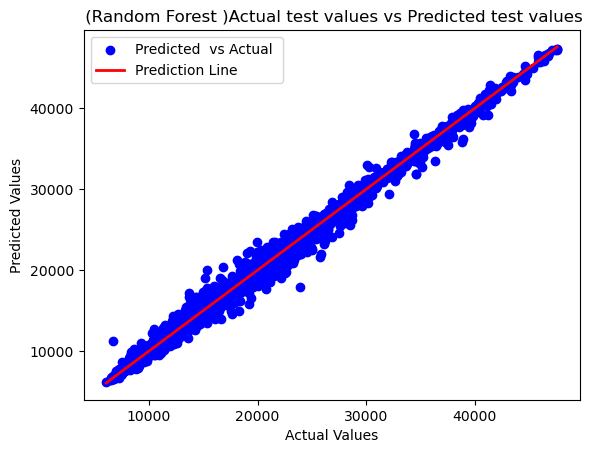

In [95]:
# Scatter plot of actual vs predicted values
plt.scatter(Y_test, Y_pred, color='blue', label='Predicted  vs Actual ')
plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], color='red', linewidth=2, label='Prediction Line')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title(' (Random Forest )Actual test values vs Predicted test values')
plt.legend()
plt.show()

Model4 -- SVR 

In [96]:
from sklearn.svm import SVR
# Create the model
svr= SVR()
# Train the model
svr.fit(X_train_scaler, Y_train)
# Make predictions
Y_pred = svr.predict(X_test_scaler)
# Evaluate the model
mse = mean_squared_error(Y_test, Y_pred)
r2 = r2_score(Y_test, Y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 32711627.963397402
R^2 Score: 0.27104624055532966


In [97]:
# Create a DataFrame with predicted and actual values as columns
df = pd.DataFrame({'Predicted Values': Y_pred, 'Actual Values': Y_test})

# Display the DataFrame
print(df)

       Predicted Values  Actual Values
25500      15693.693053    21184.98462
40040      14946.880779    13375.80547
35066      16556.844436    13967.55873
27275      16906.365044    23612.38494
3329       15169.496042    14550.36145
...                 ...            ...
9269       15740.189242    12240.00000
33689      18610.616555    29781.06583
21133      17841.010298    20276.59919
40112      17275.895086    13048.99696
7206       15367.368906    15450.69347

[10484 rows x 2 columns]


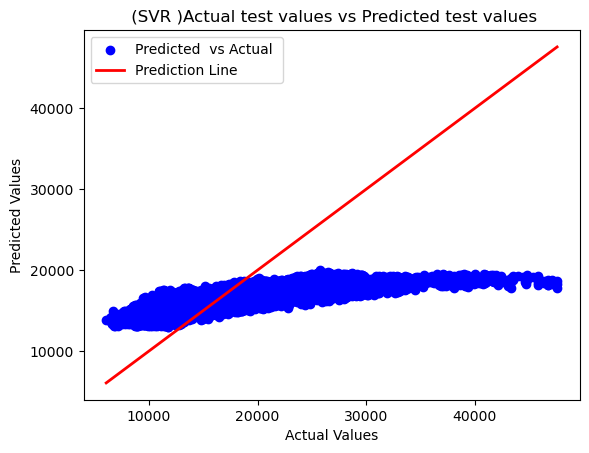

In [98]:
# Scatter plot of actual vs predicted values
plt.scatter(Y_test, Y_pred, color='blue', label='Predicted  vs Actual ')
plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], color='red', linewidth=2, label='Prediction Line')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title(' (SVR )Actual test values vs Predicted test values')
plt.legend()
plt.show()

Model5 --  K NeighborsRegressor

In [103]:
from sklearn.neighbors import KNeighborsRegressor
# Create the model
knn= KNeighborsRegressor(n_neighbors=5)
# Train the model
knn.fit(X_train_scaler, Y_train)
# Make predictions
Y_pred = knn.predict(X_test_scaler)
# Evaluate the model
mse = mean_squared_error(Y_test, Y_pred)
r2 = r2_score(Y_test, Y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 918977.2851882562
R^2 Score: 0.9795212898718519


In [104]:
# Create a DataFrame with predicted and actual values as columns
df = pd.DataFrame({'Predicted Values': Y_pred, 'Actual Values': Y_test})
# Display the DataFrame
print(df)

       Predicted Values  Actual Values
25500      19958.765344    21184.98462
40040      12714.018236    13375.80547
35066      14337.045968    13967.55873
27275      22098.878660    23612.38494
3329       14612.067180    14550.36145
...                 ...            ...
9269       13125.816236    12240.00000
33689      30464.802506    29781.06583
21133      20082.236112    20276.59919
40112      12962.626140    13048.99696
7206       15729.720604    15450.69347

[10484 rows x 2 columns]


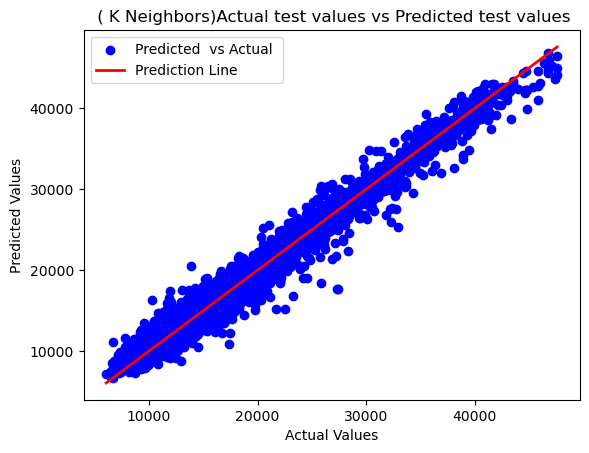

In [105]:
# Scatter plot of actual vs predicted values
plt.scatter(Y_test, Y_pred, color='blue', label='Predicted  vs Actual ')
plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], color='red', linewidth=2, label='Prediction Line')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title(' ( K Neighbors)Actual test values vs Predicted test values')
plt.legend()
plt.show()

Model6 -- XGBoost

In [106]:
from xgboost import XGBRegressor

# Create the model
xgb=XGBRegressor(objective='reg:squarederror', max_depth=3, eta=0.1, subsample=0.7, n_estimators=100)
# Train the model
xgb.fit(X_train_scaler, Y_train)
# Make predictions
Y_pred = xgb.predict(X_test_scaler)
# Evaluate the model
mse = mean_squared_error(Y_test, Y_pred)
r2 = r2_score(Y_test, Y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mean Squared Error: 1320865.795481689
R^2 Score: 0.9705655099643579


In [107]:
# Create a DataFrame with predicted and actual values as columns
df = pd.DataFrame({'Predicted Values': Y_pred, 'Actual Values': Y_test})
# Display the DataFrame
print(df)

       Predicted Values  Actual Values
25500      19575.619141    21184.98462
40040      12953.335938    13375.80547
35066      14397.190430    13967.55873
27275      20759.025391    23612.38494
3329       14907.346680    14550.36145
...                 ...            ...
9269       13686.203125    12240.00000
33689      28452.578125    29781.06583
21133      22120.210938    20276.59919
40112      13409.239258    13048.99696
7206       15745.339844    15450.69347

[10484 rows x 2 columns]


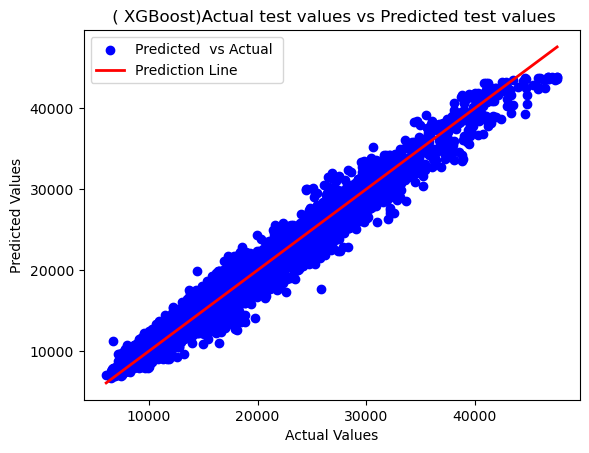

In [108]:
# Scatter plot of actual vs predicted values
plt.scatter(Y_test, Y_pred, color='blue', label='Predicted  vs Actual ')
plt.plot([Y_test.min(), Y_test.max()], [Y_test.min(), Y_test.max()], color='red', linewidth=2, label='Prediction Line')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title(' ( XGBoost)Actual test values vs Predicted test values')
plt.legend()
plt.show()

In [109]:
# Initialize models
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'SVR': SVR(),
    'KNN': KNeighborsRegressor(n_neighbors=5),
    'XGBoost': XGBRegressor(objective='reg:squarederror', max_depth=3, eta=0.1, subsample=0.7, n_estimators=100)
}

# Store the scores
mse_scores = []
r2_scores = []
model_names = []

# Train and evaluate each model
for name, model in models.items():
    model.fit(X_train_scaler, Y_train.ravel())
    Y_pred = model.predict(X_test_scaler)
    mse = mean_squared_error(Y_test, Y_pred)
    r2 = r2_score(Y_test, Y_pred)
    mse_scores.append(mse)
    r2_scores.append(r2)
    model_names.append(name)
    print(f"{name} - Mean Squared Error: {mse}, R^2 Score: {r2}")

Linear Regression - Mean Squared Error: 9862939.459094305, R^2 Score: 0.7802118926662166
Decision Tree - Mean Squared Error: 441333.4740008535, R^2 Score: 0.9901652190651692
Random Forest - Mean Squared Error: 212999.46636937512, R^2 Score: 0.9952534688293899
SVR - Mean Squared Error: 32711627.963397402, R^2 Score: 0.27104624055532966
KNN - Mean Squared Error: 918977.2851882562, R^2 Score: 0.9795212898718519
XGBoost - Mean Squared Error: 1320865.795481689, R^2 Score: 0.9705655099643579


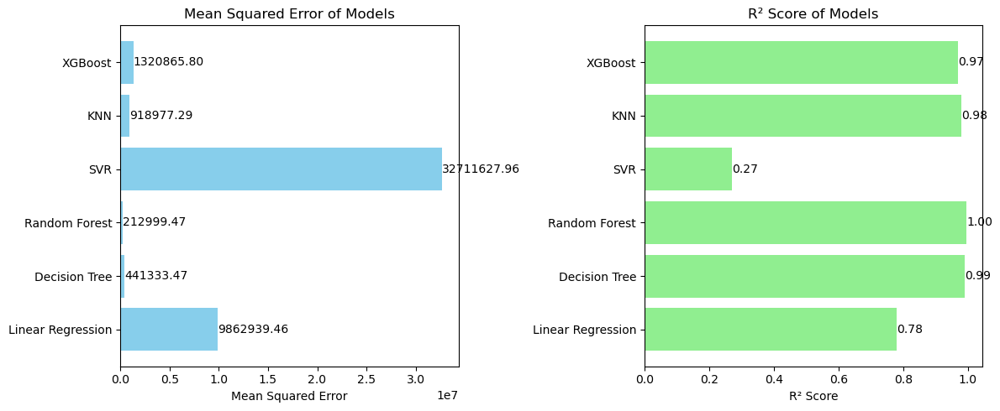

In [111]:
plt.figure(figsize=(12, 5))

# Plotting Mean Squared Error
plt.subplot(1, 2, 1)
bars = plt.barh(model_names, mse_scores, color='skyblue')
plt.xlabel('Mean Squared Error')
plt.title('Mean Squared Error of Models')

# Adding labels to bars
for bar in bars:
    width = bar.get_width()
    plt.text(width, bar.get_y() + bar.get_height() / 2, f'{width:.2f}', 
             va='center', ha='left', color='black')

# Plotting R² Scores
plt.subplot(1, 2, 2)
bars = plt.barh(model_names, r2_scores, color='lightgreen')
plt.xlabel('R² Score')
plt.title('R² Score of Models')

# Adding labels to bars
for bar in bars:
    width = bar.get_width()
    plt.text(width, bar.get_y() + bar.get_height() / 2, f'{width:.2f}', 
             va='center', ha='left', color='black')

plt.tight_layout()
plt.show()


NOTE:
1)Although some model giving 100%, not using because model should not give 100% result
2)Best model selected is Decision Tree Regressor (Reason - R2 score is good, as well as MSE is less) 

TESTING

In [112]:
import pickle
# Save the trained model to a file
with open('decision_tree_model.pkl', 'wb') as file:
    pickle.dump(dt, file)

In [113]:
# Save the scaler as well
with open('scaler.pkl', 'wb') as file:
    pickle.dump(scaler, file)

In [114]:
# Load the saved model from the file
with open('decision_tree_model.pkl', 'rb') as file:
    loaded_model = pickle.load(file)


In [115]:
# Load the scaler from the file
with open('scaler.pkl', 'rb') as file:
    loaded_scaler = pickle.load(file)

In [116]:
# Function to get user input
def get_user_input():
    
    user_input = [6.5,73.8,0.083,0.051,0.119,34055.69,16128.87,2017,1,1,0,0,52]  
    return np.array(user_input).reshape(1, -1)

# Get user input
user_input = get_user_input()

# Standardize the user input
user_input_scaled = loaded_scaler.transform(user_input)

# Make prediction using the loaded model
user_prediction = loaded_model.predict(user_input_scaled)

# Display the prediction
print(f'Predicted value: {user_prediction[0]}')


Predicted value: 20240.96386


In [117]:
power.iloc[0]

Datetime                  2017-01-01 00:00:00
Temperature                             6.559
Humidity                                 73.8
WindSpeed                               0.083
GeneralDiffuseFlows                     0.051
DiffuseFlows                            0.119
PowerConsumption_Zone1             34055.6962
PowerConsumption_Zone2            16128.87538
PowerConsumption_Zone3            20240.96386
Year                                     2017
Month                                       1
Day                                         1
Hour                                        0
Minute                                      0
Date                      2017-01-01 00:00:00
Time                                 00:00:00
Week                                       52
PowerConsumption_Zone             23475.17848
Name: 0, dtype: object

In [118]:
# Function to get user input
def get_user_input():
    # Replace this with the actual method to get user inputs, e.g., via a form or console input
    user_input = [ 5.641,77.7, 0.08,0.048,0.096,25998.98734,16993.31307,2017,1,1,0,0,52]  # Replace with actual user inputs
    return np.array(user_input).reshape(1, -1)

# Get user input
user_input = get_user_input()

# Standardize the user input
user_input_scaled = loaded_scaler.transform(user_input)

# Make prediction using the loaded model
user_prediction = loaded_model.predict(user_input_scaled)

# Display the prediction
print(f'Predicted value: {user_prediction[0]}')


Predicted value: 18130.12048


In [119]:
power.iloc[6]

Datetime                  2017-01-01 01:00:00
Temperature                             5.641
Humidity                                 77.7
WindSpeed                                0.08
GeneralDiffuseFlows                     0.048
DiffuseFlows                            0.096
PowerConsumption_Zone1            25998.98734
PowerConsumption_Zone2            16993.31307
PowerConsumption_Zone3            17945.06024
Year                                     2017
Month                                       1
Day                                         1
Hour                                        1
Minute                                      0
Date                      2017-01-01 00:00:00
Time                                 01:00:00
Week                                       52
PowerConsumption_Zone             20312.45355
Name: 6, dtype: object

Model is working well
